In [1]:
import pandas as pd
from rdkit import Chem
import seaborn as sns
from tqdm import tqdm
import numpy as np

In [2]:
tqdm.pandas()


# PubChem AID 883

## Assay info

The P450 gene superfamily is involved in the metabolism and clearance of xenobiotics. This assay used human CYP2C9 to measure the hydroxylation of deoxyluciferin (Luciferin-H; P450 Glo-Buffer) to luciferin. The luciferin is then measured by luminescence after the addition of a luciferase detection reagent. Luciferin-H concentration in the assay was equal to its Michaelis constant KM for CYP2C9. Inhibitors and some substrates limit the production of luciferin, and decrease measured luminescence.



In [3]:
df = pd.read_csv("PubChem_AID_883/AID_883_datatable_all.csv")

In [4]:
list(df.columns)

['PUBCHEM_RESULT_TAG',
 'PUBCHEM_SID',
 'PUBCHEM_CID',
 'PUBCHEM_EXT_DATASOURCE_SMILES',
 'PUBCHEM_ACTIVITY_OUTCOME',
 'PUBCHEM_ACTIVITY_SCORE',
 'PUBCHEM_ACTIVITY_URL',
 'PUBCHEM_ASSAYDATA_COMMENT',
 'Phenotype',
 'Potency',
 'Efficacy',
 'Analysis Comment',
 'Curve_Description',
 'Fit_LogAC50',
 'Fit_HillSlope',
 'Fit_R2',
 'Fit_InfiniteActivity',
 'Fit_ZeroActivity',
 'Fit_CurveClass',
 'Excluded_Points',
 'Max_Response',
 'Activity at 0.0007000000 uM',
 'Activity at 0.00160 uM',
 'Activity at 0.00370 uM',
 'Activity at 0.00820 uM',
 'Activity at 0.018 uM',
 'Activity at 0.041 uM',
 'Activity at 0.092 uM',
 'Activity at 0.205 uM',
 'Activity at 0.457 uM',
 'Activity at 1.022 uM',
 'Activity at 2.286 uM',
 'Activity at 5.112 uM',
 'Activity at 11.43 uM',
 'Activity at 25.56 uM',
 'Activity at 57.14 uM',
 'Compound QC']

In [5]:
# first 5 rows are metadata 
df[0:5]

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,...,Activity at 0.092 uM,Activity at 0.205 uM,Activity at 0.457 uM,Activity at 1.022 uM,Activity at 2.286 uM,Activity at 5.112 uM,Activity at 11.43 uM,Activity at 25.56 uM,Activity at 57.14 uM,Compound QC
0,RESULT_TYPE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,STRING,FLOAT,...,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,STRING
1,RESULT_DESCR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Indicates type of activity observed: inhibitor...,Concentration at which compound exhibits half-...,...,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,"NCGC designation for data stage: 'qHTS', 'qHTS..."
2,RESULT_UNIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MICROMOLAR,...,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,NaN
3,RESULT_IS_ACTIVE_CONCENTRATION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TRUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,RESULT_ATTR_CONC_MICROMOL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0915,0.2045,0.4572,1.0224,2.286,5.1115,11.4293,25.5558,57.1429,NaN


In [6]:
    df = df.drop(labels=list(range(0, 5)), axis=0).reset_index(
        drop=True
    )

In [7]:
df.head(10)

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,...,Activity at 0.092 uM,Activity at 0.205 uM,Activity at 0.457 uM,Activity at 1.022 uM,Activity at 2.286 uM,Activity at 5.112 uM,Activity at 11.43 uM,Activity at 25.56 uM,Activity at 57.14 uM,Compound QC
0,1,11112150.0,135398658.0,C1=CC(=CC=C1C(=O)N[C@@H](CCC(=O)O)C(=O)O)NCC2=...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,33.39,-14.1,-11.4,9.276,-9.173,-1.039,0.0981,-2.907,NaN,QC'd by Prestwick
1,2,4252894.0,3246139.0,C1=CC(=CC=C1C(=O)CSC2=NC(=NC3=C2NC=N3)N)Br,Inactive,0.0,NaN,NaN,Inactive,NaN,...,6.75,NaN,12.78,NaN,23.07,NaN,-17.5,NaN,NaN,QC'd by NCI
2,3,26751166.0,10082482.0,COC(=O)C([C@@H]1CCCC(=O)C1)C(=O)OC,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-0.0412,NaN,-6.358,NaN,-6.724,NaN,-21.3,NaN,NaN,QC'd by BUCMLD
3,4,4239835.0,3234942.0,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-9.878,NaN,15.37,NaN,8.122,NaN,8.307,NaN,4.026,QC'd by Pharmacopeia
4,5,4253520.0,266698.0,C1CCC(C1)(C#N)NC2=CC=C(C=C2)C3=CC=C(C=C3)NC4(C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-2.239,NaN,5.555,NaN,9.852,NaN,-5.077,NaN,NaN,QC'd by NCI
5,6,4238421.0,3233531.0,C1=CC(=CC(=C1)C2=CC(=NC=N2)N3C=CN=C3)C#N,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-2.931,NaN,-10.24,NaN,-5.238,NaN,NaN,NaN,NaN,QC'd by Pharmacopeia
6,7,11111648.0,5917.0,C1CCC2=NN=NN2CC1,Inactive,0.0,NaN,NaN,Inactive,NaN,...,4.381,-6.052,1.232,-5.384,12.79,-9.91,-13.09,-7.694,NaN,QC'd by Prestwick
7,8,11112635.0,6604351.0,C[C@]12CC[C@@H]3[C@@H]([C@H]1CC[C@]2(C#C)O)CCC...,Active,87.0,NaN,NaN,Inhibitor,1.2589,...,-11.36,-7.637,-23.67,-48.22,-56.92,-72.31,-79.51,-90.5,NaN,QC'd by Prestwick
8,9,4238700.0,3233809.0,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Inconclusive,22.0,NaN,NaN,Inhibitor,3.1623,...,1.332,NaN,5.77,NaN,-8.024,NaN,-30.5,NaN,-33.22,QC'd by Pharmacopeia
9,10,11114372.0,6605031.0,C1CC[C@H]([C@@H](C1)C(=O)N[C@@H](CC2=CC=CC=C2)...,Inconclusive,20.0,NaN,NaN,Inhibitor,39.8107,...,2.902,-10.1,4.427,-7.645,20.72,-17.52,-0.1437,0.1475,-59.36,QC'd by UWisc


In [8]:
df.columns

Index(['PUBCHEM_RESULT_TAG', 'PUBCHEM_SID', 'PUBCHEM_CID',
       'PUBCHEM_EXT_DATASOURCE_SMILES', 'PUBCHEM_ACTIVITY_OUTCOME',
       'PUBCHEM_ACTIVITY_SCORE', 'PUBCHEM_ACTIVITY_URL',
       'PUBCHEM_ASSAYDATA_COMMENT', 'Phenotype', 'Potency', 'Efficacy',
       'Analysis Comment', 'Curve_Description', 'Fit_LogAC50', 'Fit_HillSlope',
       'Fit_R2', 'Fit_InfiniteActivity', 'Fit_ZeroActivity', 'Fit_CurveClass',
       'Excluded_Points', 'Max_Response', 'Activity at 0.0007000000 uM',
       'Activity at 0.00160 uM', 'Activity at 0.00370 uM',
       'Activity at 0.00820 uM', 'Activity at 0.018 uM',
       'Activity at 0.041 uM', 'Activity at 0.092 uM', 'Activity at 0.205 uM',
       'Activity at 0.457 uM', 'Activity at 1.022 uM', 'Activity at 2.286 uM',
       'Activity at 5.112 uM', 'Activity at 11.43 uM', 'Activity at 25.56 uM',
       'Activity at 57.14 uM', 'Compound QC'],
      dtype='object')

In [9]:
# lets look at activity

<Axes: xlabel='PUBCHEM_ACTIVITY_OUTCOME', ylabel='Count'>

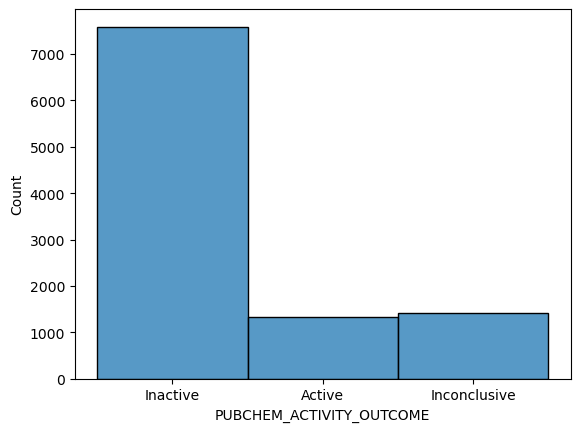

In [10]:
sns.histplot(data=df, x="PUBCHEM_ACTIVITY_OUTCOME")

<Axes: xlabel='Phenotype', ylabel='Count'>

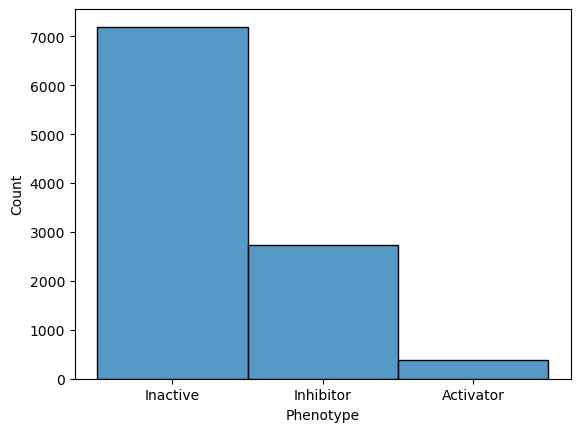

In [11]:
sns.histplot(data=df, x="Phenotype")

<Axes: xlabel='PUBCHEM_ACTIVITY_SCORE', ylabel='Count'>

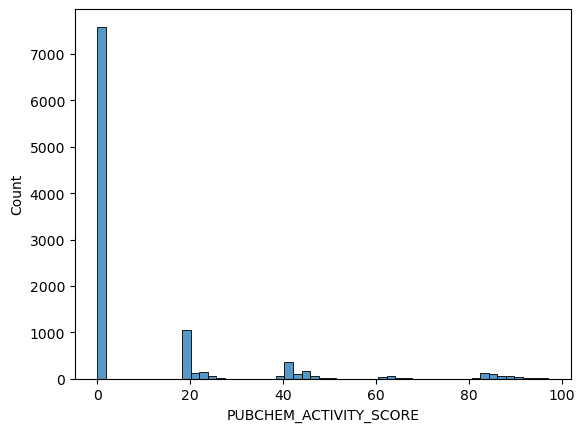

In [12]:
sns.histplot(data=df, x="PUBCHEM_ACTIVITY_SCORE")

In [13]:
import matplotlib.pyplot as plt

In [14]:
mol_col = "PUBCHEM_EXT_DATASOURCE_SMILES"
mol_id_cols = ["PUBCHEM_SID", "PUBCHEM_CID"]

In [15]:
len(df)

10320

In [16]:
df = df.dropna(subset="PUBCHEM_CID")

In [17]:
len(df)

10296

In [18]:
df["PUBCHEM_SID"] = df["PUBCHEM_SID"].astype(int)
df["PUBCHEM_CID"] = df["PUBCHEM_CID"].astype(int)

In [19]:
# standardisation of SMILES
from rdkit import Chem
from rdkit.Chem.MolStandardize import rdMolStandardize
from rdkit.rdBase import BlockLogs
import mols2grid

In [20]:

# from Pat Walters method
def standardize_smiles(smiles):
    try:
        # follows the steps in
        # https://github.com/greglandrum/RSC_OpenScience_Standardization_202104/blob/main/MolStandardize%20pieces.ipynb
        # as described **excellently** (by Greg) in
        # https://www.youtube.com/watch?v=eWTApNX8dJQ
        mol = Chem.MolFromSmiles(smiles)
    
        # removeHs, disconnect metal atoms, normalize the molecule, reionize the molecule
        clean_mol = rdMolStandardize.Cleanup(mol)
    
        # if many fragments, get the "parent" (the actual mol we are interested in) 
        parent_clean_mol = rdMolStandardize.FragmentParent(clean_mol)
    
        # try to neutralize molecule
        uncharger = rdMolStandardize.Uncharger()  # annoying, but necessary as no convenience method exists
        uncharged_parent_clean_mol = uncharger.uncharge(parent_clean_mol)
    
        # note that no attempt is made at reionization at this step
        # nor at ionization at some pH (rdkit has no pKa caculator)
        # the main aim to represent all molecules from different sources
        # in a (single) standard way, for use in ML, catalogue, etc.
    
        te = rdMolStandardize.TautomerEnumerator()  # idem
        taut_uncharged_parent_clean_mol = te.Canonicalize(uncharged_parent_clean_mol)
    
        return Chem.MolToSmiles(taut_uncharged_parent_clean_mol)
    except:
        return pd.NA

In [21]:

with BlockLogs():
    df["CANONICAL_SMILES"] = df[mol_col].progress_apply(lambda x: standardize_smiles(x))

100%|███████████████████████████████████| 10296/10296 [02:19<00:00, 74.01it/s]


In [22]:
def smi_to_inchikey(smiles):
    try:
        mol = Chem.MolFromSmiles(smiles)
        return Chem.MolToInchiKey(mol)
    except:
        return pd.NA

In [23]:
# compute inchikeys
with BlockLogs():
    df["INCHIKEY"] = df["CANONICAL_SMILES"].progress_apply(lambda x: smi_to_inchikey(x))

100%|█████████████████████████████████| 10296/10296 [00:02<00:00, 3808.47it/s]


In [24]:
df.INCHIKEY.isna().sum() # there are a few that couldn't be standardised

np.int64(1)

In [25]:
df.dropna(subset="INCHIKEY")

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,...,Activity at 0.457 uM,Activity at 1.022 uM,Activity at 2.286 uM,Activity at 5.112 uM,Activity at 11.43 uM,Activity at 25.56 uM,Activity at 57.14 uM,Compound QC,CANONICAL_SMILES,INCHIKEY
0,1,11112150,135398658,C1=CC(=CC=C1C(=O)N[C@@H](CCC(=O)O)C(=O)O)NCC2=...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-11.4,9.276,-9.173,-1.039,0.0981,-2.907,NaN,QC'd by Prestwick,Nc1nc(=O)c2nc(CNc3ccc(C(=O)NC(CCC(=O)O)C(=O)O)...,OVBPIULPVIDEAO-UHFFFAOYSA-N
1,2,4252894,3246139,C1=CC(=CC=C1C(=O)CSC2=NC(=NC3=C2NC=N3)N)Br,Inactive,0.0,NaN,NaN,Inactive,NaN,...,12.78,NaN,23.07,NaN,-17.5,NaN,NaN,QC'd by NCI,Nc1nc(SCC(=O)c2ccc(Br)cc2)c2[nH]cnc2n1,QCIUQGMYQZLWQV-UHFFFAOYSA-N
2,3,26751166,10082482,COC(=O)C([C@@H]1CCCC(=O)C1)C(=O)OC,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-6.358,NaN,-6.724,NaN,-21.3,NaN,NaN,QC'd by BUCMLD,COC(=O)C(C(=O)OC)[C@@H]1CCCC(=O)C1,XRRVFMYYAGGSJO-SSDOTTSWSA-N
3,4,4239835,3234942,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,15.37,NaN,8.122,NaN,8.307,NaN,4.026,QC'd by Pharmacopeia,COc1ccc(-c2nc3cnc(OC)nc3n(Cc3ccc(F)cc3)c2=O)cc1,LSZNTYYDGMZAQA-UHFFFAOYSA-N
4,5,4253520,266698,C1CCC(C1)(C#N)NC2=CC=C(C=C2)C3=CC=C(C=C3)NC4(C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,5.555,NaN,9.852,NaN,-5.077,NaN,NaN,QC'd by NCI,N#CC1(Nc2ccc(-c3ccc(NC4(C#N)CCCC4)cc3)cc2)CCCC1,DBCCRWIMQOCVFV-UHFFFAOYSA-N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10315,10316,17385265,3247182,CN(C)C(=O)C1=CC2=C(N1CCC3=CC=CC=N3)C[C@@H]4[C@...,Inconclusive,21.0,NaN,NaN,Inhibitor,10,...,-7.433,NaN,9.269,NaN,-27.35,NaN,-47.05,QC'd by UPCMLD,COC(=O)[C@@]1(Cc2ccc(F)cc2)[C@H]2c3cc(C(=O)N(C...,KLPQGUOKRRAJCQ-ARROIKNCSA-N
10316,10317,11113622,92142,C1CC(=O)NC(=O)[C@H]1N2C(=O)C3=CC=CC=C3C2=O,Inactive,0.0,NaN,NaN,Inactive,NaN,...,6.41,4.816,-13.86,2.079,-7.434,-1.471,1.615,QC'd by Tocris,O=C1CCC(N2C(=O)c3ccccc3C2=O)C(=O)N1,UEJJHQNACJXSKW-UHFFFAOYSA-N
10317,10318,4253088,80733,C1=CC2=C(C=C1[N+](=O)[O-])C(=O)C3=CC=C4C5=CC=C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,12.85,NaN,-3.84,NaN,-26.94,NaN,NaN,QC'd by NCI,O=C1c2cc([N+](=O)[O-])ccc2-c2ccc3c4ccc5c6c(ccc...,KDVDMQVITMTCAH-UHFFFAOYSA-N
10318,10319,26751069,16758503,C/C(=N\O[C@H]1[C@@H]([C@H]([C@H]([C@H](O1)COC(...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-8.055,NaN,10.57,NaN,4.267,NaN,NaN,QC'd by BUCMLD,CC(=O)OC[C@H]1O[C@@H](O/N=C(\C)CCN2CCc3nc(-c4c...,WGCFLVZYYXDOOX-ZCCVPCTFSA-N


In [26]:
# lets gather up the activities?

In [27]:
# ok, clean up DF, and segement into active and inactives,

In [28]:
keep_cols = ["CANONICAL_SMILES", "INCHIKEY", "PUBCHEM_ACTIVITY_OUTCOME", "PUBCHEM_CID"]

In [29]:
clean = df[keep_cols]

In [30]:
clean["dataset"] = "aid883"
clean["data_type"] = "assay"

/tmp/ipykernel_17852/3230944712.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["dataset"] = "aid883"
/tmp/ipykernel_17852/3230944712.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["data_type"] = "assay"


In [31]:
clean["active"] = clean["PUBCHEM_ACTIVITY_OUTCOME"] == "Active"

/tmp/ipykernel_17852/212178452.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["active"] = clean["PUBCHEM_ACTIVITY_OUTCOME"] == "Active"


In [32]:
mols2grid.display(clean, smiles_col="CANONICAL_SMILES")

MolGridWidget()

In [33]:
clean.head()
clean["common_name"] = pd.NA
clean["action_type"] = "inhibitor"

/tmp/ipykernel_17852/3481227677.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["common_name"] = pd.NA
/tmp/ipykernel_17852/3481227677.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["action_type"] = "inhibitor"


In [34]:
clean.to_csv("./processed/AID_883.csv", index=False)

In [35]:
# spot checked structures with a few pubchem CIDs, looks like translation went ok